# Нейросеть для классификации таблеток

Решить задачу классификации, используя CNN. Входные данные — фото таблетки, требуемый результат — название таблетки (из заданного списка).

In [1]:
# Автоматическая перезагрузка модулей при изменении (для разработки)
%load_ext autoreload
%autoreload 2

In [2]:
# Импорты библиотек для работы с данными и визуализацией
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import random
from PIL import Image

# Импорты для машинного обучения
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
from torchvision.datasets import ImageFolder
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

from tqdm.auto import tqdm

from sklearn.metrics import classification_report

d:\miniconda3\envs\dle\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Устанавливаем seed для воспроизводимости результатов
RANDOM_STATE=42
random.seed(RANDOM_STATE)

In [4]:
DEVICE = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

## EDA

In [5]:
# Получаем список всех директорий-лейблов из папки data/train
train_path = Path('data/train')
labels = sorted([d.name for d in train_path.iterdir() if d.is_dir()])

print(f"Всего классов (лейблов): {len(labels)}")
print("\nСписок всех лейблов:")
for i, label in enumerate(labels, 1):
    print(f"{i}. {label}")

Всего классов (лейблов): 84

Список всех лейблов:
1. acc_long_600_mg
2. advil_ultra_forte
3. akineton_2_mg
4. algoflex_forte_dolo_400_mg
5. algoflex_rapid_400_mg
6. algopyrin_500_mg
7. ambroxol_egis_30_mg
8. apranax_550_mg
9. aspirin_ultra_500_mg
10. atoris_20_mg
11. atorvastatin_teva_20_mg
12. betaloc_50_mg
13. bila_git
14. c_vitamin_teva_500_mg
15. calci_kid
16. cataflam_50_mg
17. cataflam_dolo_25_mg
18. cetirizin_10_mg
19. cold_fx
20. coldrex
21. concor_10_mg
22. concor_5_mg
23. condrosulf_800_mg
24. controloc_20_mg
25. covercard_plus_10_mg_2_5_mg_5_mg
26. coverex_4_mg
27. diclopram_75-mg_20-mg
28. dorithricin_mentol
29. dulsevia_60_mg
30. enterol_250_mg
31. favipiravir_meditop_200_mg
32. ibumax_400_mg
33. jutavit_c_vitamin
34. jutavit_cink
35. kalcium_magnezium_cink
36. kalium_r
37. koleszterin_kontroll
38. lactamed
39. lactiv_plus
40. laresin_10_mg
41. letrox_50_mikrogramm
42. lordestin_5_mg
43. merckformin_xr_1000_mg
44. meridian
45. metothyrin_10_mg
46. mezym_forte_10_000_egyseg

In [6]:
# Анализ баланса классов на обучающей выборке
class_counts = {}
for label in labels:
    label_path = train_path / label
    count = len(list(label_path.glob('*')))  # Подсчитываем все файлы в директории класса
    class_counts[label] = count

# Создаем DataFrame для удобства анализа
df_class_balance = pd.DataFrame({
    'Класс': list(class_counts.keys()),
    'Количество': list(class_counts.values())
}).sort_values('Количество', ascending=False)

print("Статистика по классам:")
print(f"Минимум изображений в классе: {df_class_balance['Количество'].min()}")
print(f"Максимум изображений в классе: {df_class_balance['Количество'].max()}")
print(f"Среднее количество изображений: {df_class_balance['Количество'].mean():.2f}")
print(f"Медиана: {df_class_balance['Количество'].median():.2f}")
print(f"Стандартное отклонение: {df_class_balance['Количество'].std():.2f}")
print(f"\nДисбаланс (max/min): {df_class_balance['Количество'].max() / df_class_balance['Количество'].min():.2f}x")

Статистика по классам:
Минимум изображений в классе: 28
Максимум изображений в классе: 28
Среднее количество изображений: 28.00
Медиана: 28.00
Стандартное отклонение: 0.00

Дисбаланс (max/min): 1.00x


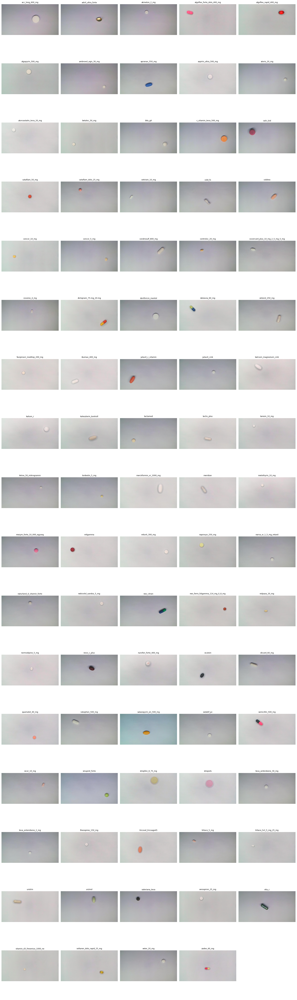

In [7]:
# Собираем случайные изображения из каждого класса
sample_images = {}
for label in labels:
    label_path = train_path / label
    images = list(label_path.glob('*.jpg')) + list(label_path.glob('*.png')) + list(label_path.glob('*.JPG'))
    if images:
        sample_images[label] = random.choice(images)

# Визуализация
cols = 5
rows = (len(sample_images) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
axes = axes.flatten() if len(sample_images) > 1 else [axes]

for idx, (label, img_path) in enumerate(sample_images.items()):
    img = Image.open(img_path)
    axes[idx].imshow(img)
    axes[idx].set_title(label, fontsize=9)
    axes[idx].axis('off')

for idx in range(len(sample_images), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

### Характеристики выборки
- Многие таблетки визуально похожи (цвет, форма, размер).
- Освещение и фон немного отличаются от фото к фото.
- Мелкие детали (тиснение, надписи) трудно различимы.
- Модель может переобучиться на цвет/яркость, а не на форму.

## Загрузка и предобработка данных

In [5]:
# Параметры
BATCH_SIZE = 64
IMG_SIZE = 300  
NUM_WORKERS = 4  

In [ ]:
# Трансформации для обучающей выборки (с аугментацией)
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.85, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=7),
    transforms.ColorJitter(
        brightness=0.10,   # слегка меняем освещенность
        contrast=0.10,     # чуть-чуть контраст
        saturation=0.05,   # почти не трогаем насыщенность
        hue=0.02           # минимально трогаем оттенок
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
    transforms.RandomErasing(p=0.15)
])

test_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

In [17]:
# Создание датасетов
train_dataset = ImageFolder(root='data/train', transform=train_transforms)
test_dataset = ImageFolder(root='data/test', transform=test_transforms)


# Dataloaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

In [8]:
def train_model(
    model_save_name,
    model,
    scheduler,
    optimizer,
    criterion,
    train_loader,
    test_loader,
    device,
    epochs,
    patience,
):
    best_vloss = float("inf")
    epochs_no_improve = 0
    train_losses, val_losses, lrs = [], [], []

    for epoch in range(epochs):
        print(f"\n===== Epoch {epoch + 1}/{epochs} =====")

        # Train
        model.train()
        running_loss = 0.0

        train_bar = tqdm(
            train_loader,
            desc=f"Epoch {epoch + 1}/{epochs} [train]",
            leave=False
        )

        for batch_idx, (inputs, labels) in enumerate(train_bar, start=1):
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            avg_loss = running_loss / batch_idx
            train_bar.set_postfix({"loss": f"{avg_loss:.4f}"})

        train_loss = running_loss / len(train_loader)

        # Validate
        model.eval()
        running_vloss = 0.0

        val_bar = tqdm(
            test_loader,
            desc=f"Epoch {epoch + 1}/{epochs} [val]",
            leave=False
        )

        with torch.no_grad():
            for batch_idx, (inputs, labels) in enumerate(val_bar, start=1):
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                vloss = criterion(outputs, labels)
                running_vloss += vloss.item()

                avg_vloss = running_vloss / batch_idx
                val_bar.set_postfix({"val_loss": f"{avg_vloss:.4f}"})

        val_loss = running_vloss / len(test_loader)

        # Logging / LR / Early stopping
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        lrs.append(optimizer.param_groups[0]["lr"])

        if val_loss < best_vloss:
            best_vloss = val_loss
            epochs_no_improve = 0
            model_path = f"models/{model_save_name}_{epoch + 1}.pt"
            torch.save(model.state_dict(), model_path)
            print(f"Новая лучшая модель сохранена: {model_path} (val_loss = {val_loss:.4f})")
        else:
            epochs_no_improve += 1
            print(f"Нет улучшения val_loss ({val_loss:.4f}) уже {epochs_no_improve} эпох(и) подряд")

        scheduler.step(val_loss)

        current_lr = optimizer.param_groups[0]["lr"]
        print(
            f"Итоги эпохи {epoch + 1}: "
            f"train loss = {train_loss:.4f}, "
            f"val loss = {val_loss:.4f}, "
            f"lr = {current_lr:.6f}"
        )

        if epochs_no_improve >= patience:
            print(f"\nРанняя остановка: нет улучшения val_loss {patience} эпох подряд.")
            break

    print("\nОбучение завершено!")
    return model, train_losses, val_losses, lrs

In [9]:
def evaluate_model(model, test_loader, test_dataset, device):
    """
    Оценивает модель на тестовом наборе и выводит classification_report.
    
    Аргументы:
        model (torch.nn.Module): обученная PyTorch модель
        test_loader (DataLoader): DataLoader с тестовыми данными
        test_dataset (Dataset): датасет (нужен для получения имён классов)
        device (torch.device): устройство ('cuda' или 'cpu')
    """
    model.to(device)
    model.eval()

    labels_predicted = []
    labels_true = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            labels_predicted.extend(predicted.cpu().numpy())
            labels_true.extend(labels.cpu().numpy())

    print(classification_report(labels_true, labels_predicted, target_names=test_dataset.classes))

## Свой классификатор с нуля

**Описание:**  
Простая сверточная нейронная сеть (CNN) для классификации изображений на 84 класса.
Модель состоит из трёх сверточных блоков (по два слоя Conv2d + BatchNorm + ReLU) с поэтапным увеличением числа каналов, последующего усреднения признаков и двух полносвязных слоёв.

**Архитектура:**
- **Вход:** RGB-изображение (3×H×W)
- **Три сверточных блока:**
  - Блок 1: `3 → 64`, два Conv2d, BatchNorm, ReLU, MaxPool(2×2)
  - Блок 2: `64 → 128`, два Conv2d, BatchNorm, ReLU, MaxPool(2×2)
  - Блок 3: `128 → 256`, два Conv2d, BatchNorm, ReLU, MaxPool(2×2)
- **BatchNorm2d** — нормализация активаций, ускоряет обучение и повышает устойчивость.
- **MaxPool2d(2×2)** — уменьшает размер карт признаков, добавляя трансляционную инвариантность.
- **AdaptiveAvgPool2d(1)** — делает модель независимой от входных размеров, сводя карты признаков к вектору длиной 256.
- **Классификатор:**  
  `Flatten → Linear(256→256) → ReLU → Dropout(0.3) → Linear(256→84)`
- **Выход:** логиты для 84 классов (используется с `nn.CrossEntropyLoss`).

**Схема:**  

```text
Input (3×H×W)
↓
[Conv2d(3→64) → BatchNorm → ReLU → Conv2d(64→64) → BatchNorm → ReLU → MaxPool]
↓
[Conv2d(64→128) → BatchNorm → ReLU → Conv2d(128→128) → BatchNorm → ReLU → MaxPool]
↓
[Conv2d(128→256) → BatchNorm → ReLU → Conv2d(256→256) → BatchNorm → ReLU → MaxPool]
↓
AdaptiveAvgPool2d(1)
↓
Flatten → Linear(256→256) → ReLU → Dropout(0.3) → Linear(256→84)
↓
Output (84 классов)

In [19]:
class MedsClassifier(nn.Module):
    def __init__(self, num_classes=84):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(128, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        return self.classifier(x)

In [20]:
# Инициализация модели
custom_model = MedsClassifier().to(DEVICE)

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)  # мягкие метки для устойчивости

optimizer = optim.AdamW(
    custom_model.parameters(),
    lr=1e-3,           
    weight_decay=1e-4  
)

# Планировщик learning rate (ReduceLROnPlateau)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=2,         # даём немного больше времени перед понижением lr
    min_lr=1e-6,        # нижний предел, чтобы не "умер" learning rate
    verbose=True
)

d:\miniconda3\envs\dle\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [21]:
trained_model, train_losses, val_losses, lrs = train_model(
    model_save_name="custom_model",
    model=custom_model,
    scheduler=scheduler,
    optimizer=optimizer,
    criterion=criterion,
    train_loader=train_loader,
    test_loader=test_loader,
    device=DEVICE,
    epochs=50,
    patience=5
)


===== Epoch 1/50 =====


Новая лучшая модель сохранена: models/custom_model_1.pt (val_loss = 4.3436)
Итоги эпохи 1: train loss = 4.4249, val loss = 4.3436, lr = 0.001000

===== Epoch 2/50 =====


Новая лучшая модель сохранена: models/custom_model_2.pt (val_loss = 4.1052)
Итоги эпохи 2: train loss = 4.2474, val loss = 4.1052, lr = 0.001000

===== Epoch 3/50 =====


Нет улучшения val_loss (4.1484) уже 1 эпох(и) подряд
Итоги эпохи 3: train loss = 4.0657, val loss = 4.1484, lr = 0.001000

===== Epoch 4/50 =====


Новая лучшая модель сохранена: models/custom_model_4.pt (val_loss = 3.8508)
Итоги эпохи 4: train loss = 3.9154, val loss = 3.8508, lr = 0.001000

===== Epoch 5/50 =====


Новая лучшая модель сохранена: models/custom_model_5.pt (val_loss = 3.6744)
Итоги эпохи 5: train loss = 3.8223, val loss = 3.6744, lr = 0.001000

===== Epoch 6/50 =====


Нет улучшения val_loss (3.7443) уже 1 эпох(и) подряд
Итоги эпохи 6: train loss = 3.7118, val loss = 3.7443, lr = 0.001000

===== Epoch 7/50 =====


Новая лучшая модель сохранена: models/custom_model_7.pt (val_loss = 3.5019)
Итоги эпохи 7: train loss = 3.6283, val loss = 3.5019, lr = 0.001000

===== Epoch 8/50 =====


Нет улучшения val_loss (3.5913) уже 1 эпох(и) подряд
Итоги эпохи 8: train loss = 3.5852, val loss = 3.5913, lr = 0.001000

===== Epoch 9/50 =====


Новая лучшая модель сохранена: models/custom_model_9.pt (val_loss = 3.3981)
Итоги эпохи 9: train loss = 3.4564, val loss = 3.3981, lr = 0.001000

===== Epoch 10/50 =====


Новая лучшая модель сохранена: models/custom_model_10.pt (val_loss = 3.2628)
Итоги эпохи 10: train loss = 3.3645, val loss = 3.2628, lr = 0.001000

===== Epoch 11/50 =====


Нет улучшения val_loss (3.6738) уже 1 эпох(и) подряд
Итоги эпохи 11: train loss = 3.2931, val loss = 3.6738, lr = 0.001000

===== Epoch 12/50 =====


Нет улучшения val_loss (3.3585) уже 2 эпох(и) подряд
Итоги эпохи 12: train loss = 3.2086, val loss = 3.3585, lr = 0.001000

===== Epoch 13/50 =====


Новая лучшая модель сохранена: models/custom_model_13.pt (val_loss = 3.0537)
Итоги эпохи 13: train loss = 3.1350, val loss = 3.0537, lr = 0.001000

===== Epoch 14/50 =====


Нет улучшения val_loss (3.5243) уже 1 эпох(и) подряд
Итоги эпохи 14: train loss = 3.0599, val loss = 3.5243, lr = 0.001000

===== Epoch 15/50 =====


Нет улучшения val_loss (3.1917) уже 2 эпох(и) подряд
Итоги эпохи 15: train loss = 3.0614, val loss = 3.1917, lr = 0.001000

===== Epoch 16/50 =====


Нет улучшения val_loss (3.5108) уже 3 эпох(и) подряд
Итоги эпохи 16: train loss = 2.9988, val loss = 3.5108, lr = 0.000500

===== Epoch 17/50 =====


Новая лучшая модель сохранена: models/custom_model_17.pt (val_loss = 2.8589)
Итоги эпохи 17: train loss = 2.9059, val loss = 2.8589, lr = 0.000500

===== Epoch 18/50 =====


Нет улучшения val_loss (2.9909) уже 1 эпох(и) подряд
Итоги эпохи 18: train loss = 2.8663, val loss = 2.9909, lr = 0.000500

===== Epoch 19/50 =====


Новая лучшая модель сохранена: models/custom_model_19.pt (val_loss = 2.7682)
Итоги эпохи 19: train loss = 2.8170, val loss = 2.7682, lr = 0.000500

===== Epoch 20/50 =====


Нет улучшения val_loss (2.9325) уже 1 эпох(и) подряд
Итоги эпохи 20: train loss = 2.7805, val loss = 2.9325, lr = 0.000500

===== Epoch 21/50 =====


Новая лучшая модель сохранена: models/custom_model_21.pt (val_loss = 2.7216)
Итоги эпохи 21: train loss = 2.7554, val loss = 2.7216, lr = 0.000500

===== Epoch 22/50 =====


Нет улучшения val_loss (2.9484) уже 1 эпох(и) подряд
Итоги эпохи 22: train loss = 2.7453, val loss = 2.9484, lr = 0.000500

===== Epoch 23/50 =====


Нет улучшения val_loss (2.7510) уже 2 эпох(и) подряд
Итоги эпохи 23: train loss = 2.6917, val loss = 2.7510, lr = 0.000500

===== Epoch 24/50 =====


Нет улучшения val_loss (2.9306) уже 3 эпох(и) подряд
Итоги эпохи 24: train loss = 2.6148, val loss = 2.9306, lr = 0.000250

===== Epoch 25/50 =====


Новая лучшая модель сохранена: models/custom_model_25.pt (val_loss = 2.6036)
Итоги эпохи 25: train loss = 2.6085, val loss = 2.6036, lr = 0.000250

===== Epoch 26/50 =====


Новая лучшая модель сохранена: models/custom_model_26.pt (val_loss = 2.5864)
Итоги эпохи 26: train loss = 2.5839, val loss = 2.5864, lr = 0.000250

===== Epoch 27/50 =====


Нет улучшения val_loss (2.7785) уже 1 эпох(и) подряд
Итоги эпохи 27: train loss = 2.5433, val loss = 2.7785, lr = 0.000250

===== Epoch 28/50 =====


Новая лучшая модель сохранена: models/custom_model_28.pt (val_loss = 2.5848)
Итоги эпохи 28: train loss = 2.5322, val loss = 2.5848, lr = 0.000250

===== Epoch 29/50 =====


Нет улучшения val_loss (2.7248) уже 1 эпох(и) подряд
Итоги эпохи 29: train loss = 2.5660, val loss = 2.7248, lr = 0.000250

===== Epoch 30/50 =====


Новая лучшая модель сохранена: models/custom_model_30.pt (val_loss = 2.5283)
Итоги эпохи 30: train loss = 2.5134, val loss = 2.5283, lr = 0.000250

===== Epoch 31/50 =====


Новая лучшая модель сохранена: models/custom_model_31.pt (val_loss = 2.4720)
Итоги эпохи 31: train loss = 2.4969, val loss = 2.4720, lr = 0.000250

===== Epoch 32/50 =====


Нет улучшения val_loss (2.4835) уже 1 эпох(и) подряд
Итоги эпохи 32: train loss = 2.4847, val loss = 2.4835, lr = 0.000250

===== Epoch 33/50 =====


Новая лучшая модель сохранена: models/custom_model_33.pt (val_loss = 2.4636)
Итоги эпохи 33: train loss = 2.4832, val loss = 2.4636, lr = 0.000250

===== Epoch 34/50 =====


Нет улучшения val_loss (2.6635) уже 1 эпох(и) подряд
Итоги эпохи 34: train loss = 2.4543, val loss = 2.6635, lr = 0.000250

===== Epoch 35/50 =====


Нет улучшения val_loss (2.4767) уже 2 эпох(и) подряд
Итоги эпохи 35: train loss = 2.4323, val loss = 2.4767, lr = 0.000250

===== Epoch 36/50 =====


Нет улучшения val_loss (2.6650) уже 3 эпох(и) подряд
Итоги эпохи 36: train loss = 2.4412, val loss = 2.6650, lr = 0.000125

===== Epoch 37/50 =====


Новая лучшая модель сохранена: models/custom_model_37.pt (val_loss = 2.3442)
Итоги эпохи 37: train loss = 2.4245, val loss = 2.3442, lr = 0.000125

===== Epoch 38/50 =====


Нет улучшения val_loss (2.4233) уже 1 эпох(и) подряд
Итоги эпохи 38: train loss = 2.4047, val loss = 2.4233, lr = 0.000125

===== Epoch 39/50 =====


Нет улучшения val_loss (2.3572) уже 2 эпох(и) подряд
Итоги эпохи 39: train loss = 2.3752, val loss = 2.3572, lr = 0.000125

===== Epoch 40/50 =====


Нет улучшения val_loss (2.3617) уже 3 эпох(и) подряд
Итоги эпохи 40: train loss = 2.3840, val loss = 2.3617, lr = 0.000063

===== Epoch 41/50 =====


Нет улучшения val_loss (2.4239) уже 4 эпох(и) подряд
Итоги эпохи 41: train loss = 2.3379, val loss = 2.4239, lr = 0.000063

===== Epoch 42/50 =====


Нет улучшения val_loss (2.3670) уже 5 эпох(и) подряд
Итоги эпохи 42: train loss = 2.3621, val loss = 2.3670, lr = 0.000063

Ранняя остановка: нет улучшения val_loss 5 эпох подряд.

Обучение завершено!


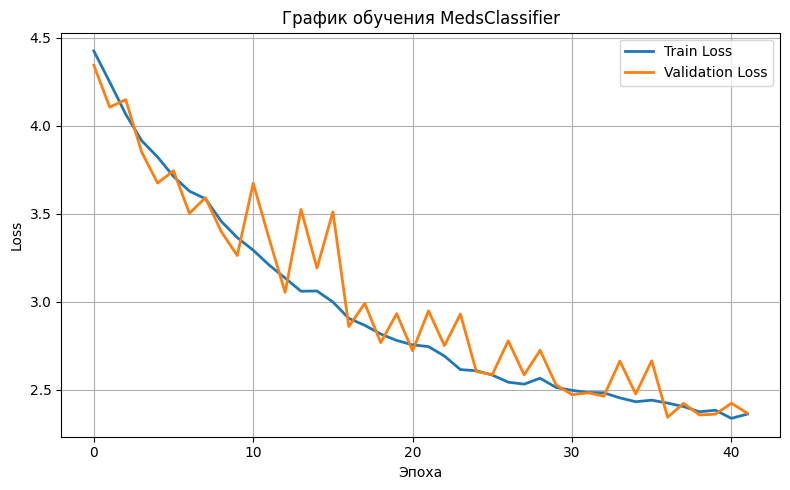

In [22]:

# Построение графика обучения
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss", linewidth=2)
plt.plot(val_losses, label="Validation Loss", linewidth=2)
plt.xlabel("Эпоха")
plt.ylabel("Loss")
plt.title("График обучения MedsClassifier")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 📈 Ход обучения модели

MedsClassifier обучалась стабильно:  
- Loss снизился с ~4.5 до ~2.5 за 40 эпох.  
- Разрыва между Train и Validation Loss нет — переобучения не наблюдается.  
- Модель достигла плато, то есть дальнейшее обучение не даёт заметного улучшения.  
- Обучение прошло корректно, но итоговая точность (≈53%) указывает на ограниченные возможности модели при текущей архитектуре.

In [23]:
evaluate_model(custom_model, test_loader, test_dataset, DEVICE)

                                  precision    recall  f1-score   support

                 acc_long_600_mg       1.00      0.83      0.91         6
               advil_ultra_forte       1.00      0.83      0.91         6
                   akineton_2_mg       1.00      0.33      0.50         6
      algoflex_forte_dolo_400_mg       1.00      0.83      0.91         6
           algoflex_rapid_400_mg       1.00      1.00      1.00         6
                algopyrin_500_mg       0.86      1.00      0.92         6
             ambroxol_egis_30_mg       0.67      0.67      0.67         6
                  apranax_550_mg       1.00      1.00      1.00         6
            aspirin_ultra_500_mg       0.08      0.33      0.13         6
                    atoris_20_mg       1.00      0.17      0.29         6
         atorvastatin_teva_20_mg       0.40      0.33      0.36         6
                   betaloc_50_mg       0.60      0.50      0.55         6
                        bila_git     

d:\miniconda3\envs\dle\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\miniconda3\envs\dle\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\miniconda3\envs\dle\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### 📊 Оценка кастомной CNN с учётом датасета

Модель обучалась на изображениях лекарственных препаратов, представленных в датасете, где каждое изображение отображает капсулу или таблетку на нейтральном фоне. Визуально препараты часто схожи по форме, цвету и текстуре, что усложняет задачу классификации для CNN.

---

### ❌ Классы, где модель ошибается чаще всего
Наибольшее количество ошибок зафиксировано для классов:
- `cold_fx`
- `laresin_10_mg`
- `meridian`
- `metothyrin_10_mg`
- `verospiron_25_mg`

**Причины:**
- Визуальная **схожесть таблеток** между собой (например, белые или бежевые круглые формы без маркировки).  
- **Отсутствие выраженных визуальных признаков** (логотипов, надписей, ярких цветов).  
- **Однородный фон и освещение** в датасете, что затрудняет обучение фильтров CNN выделять контрастные особенности.

---

### ✅ Классы, где ошибок нет
Безошибочно распознаются:
- `algoflex_rapid_400_mg`
- `apranax_550_mg`
- `dulsevia_60_mg`
- `mezym_forte_10_000_egyseg`
- `milgamma`

**Причины:**
- Таблетки имеют **ярко выраженные визуальные отличия** — насыщенные цвета (красный, синий, жёлтый), уникальную форму или контрастную поверхность.  
- Модель уверенно выделяет паттерны текстуры и цвета, характерные именно для этих классов.

---

### 📉 Итоговые выводы
Кастомная CNN показала **точность 0.53**, что **существенно ниже требуемых 0.75**.  
Несмотря на способность корректно классифицировать визуально выделяющиеся препараты, модель не справляется с различением однотипных по форме и цвету таблеток.  
Это указывает на то, что **архитектура и обученные признаки пока не обеспечивают достаточную степень обобщения** для достижения 75% точности на данном датасете.

## Модель EfficientNet-B3 с transfer learning

Модель основана на **EfficientNet-B3**, предобученной на ImageNet, и адаптирована для классификации **84 классов**.

- **Базовая часть (feature extractor)**: EfficientNet-B3 с MBConv-блоками, извлекающими признаки. Все её слои заморожены.  
- **Классификатор**: Dropout(0.3) + Linear(1536 → 84), обучается заново.  
- **Выход**: вектор вероятностей по 84 классам.

In [10]:
from torchvision.models import efficientnet_b3, EfficientNet_B3_Weights

class MedsEfficientNetB3(nn.Module):
    def __init__(
        self,
        num_classes: int = 84,
        num_unfrozen_blocks: int = 0,   # сколько последних блоков features разморозить
    ):
        super().__init__()

        # загружаем предобученную EfficientNet-B3
        weights = EfficientNet_B3_Weights.IMAGENET1K_V1
        self.model = efficientnet_b3(weights=weights)

        # заменяем классификатор под своё кол-во классов
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(in_features, num_classes)
        )

        # сначала всё замораживаем
        for p in self.model.parameters():
            p.requires_grad = False

        # размораживаем classifier
        for p in self.model.classifier.parameters():
            p.requires_grad = True

        if num_unfrozen_blocks > 0 :
            # размораживаем последние num_unfrozen_blocks блоков feature-экстрактора
            total_blocks = len(self.model.features)  # список блоков
            start_idx = max(0, total_blocks - num_unfrozen_blocks)

            for idx in range(start_idx, total_blocks):
                for p in self.model.features[idx].parameters():
                    p.requires_grad = True

    def forward(self, x):
        return self.model(x)

In [25]:
# Инициализация модели
transfer_model = MedsEfficientNetB3().to(DEVICE)

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)  # помогает против переобучения

optimizer = optim.AdamW(
    transfer_model.parameters(),
    lr=1e-3,         
    weight_decay=1e-4 
)

# Планировщик learning rate (снижение при плато по val_loss)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=2,       # даём 2 эпохи "потерпеть" перед снижением lr
    min_lr=1e-6,      # чтобы lr не уползал в ноль
    verbose=True
)

d:\miniconda3\envs\dle\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [26]:
trained_model, train_losses, val_losses, lrs = train_model(
    model_save_name="transfer_model",
    model=transfer_model,
    scheduler=scheduler,
    optimizer=optimizer,
    criterion=criterion,
    train_loader=train_loader,
    test_loader=test_loader,
    device=DEVICE,
    epochs=50,
    patience=5
)


===== Epoch 1/50 =====


Новая лучшая модель сохранена: models/transfer_model_1.pt (val_loss = 4.0145)
Итоги эпохи 1: train loss = 4.2819, val loss = 4.0145, lr = 0.001000

===== Epoch 2/50 =====


Новая лучшая модель сохранена: models/transfer_model_2.pt (val_loss = 3.6470)
Итоги эпохи 2: train loss = 3.8273, val loss = 3.6470, lr = 0.001000

===== Epoch 3/50 =====


Новая лучшая модель сохранена: models/transfer_model_3.pt (val_loss = 3.3601)
Итоги эпохи 3: train loss = 3.4737, val loss = 3.3601, lr = 0.001000

===== Epoch 4/50 =====


Новая лучшая модель сохранена: models/transfer_model_4.pt (val_loss = 3.1012)
Итоги эпохи 4: train loss = 3.1904, val loss = 3.1012, lr = 0.001000

===== Epoch 5/50 =====


Новая лучшая модель сохранена: models/transfer_model_5.pt (val_loss = 2.9135)
Итоги эпохи 5: train loss = 2.9787, val loss = 2.9135, lr = 0.001000

===== Epoch 6/50 =====


Новая лучшая модель сохранена: models/transfer_model_6.pt (val_loss = 2.7661)
Итоги эпохи 6: train loss = 2.7686, val loss = 2.7661, lr = 0.001000

===== Epoch 7/50 =====


Новая лучшая модель сохранена: models/transfer_model_7.pt (val_loss = 2.6446)
Итоги эпохи 7: train loss = 2.6347, val loss = 2.6446, lr = 0.001000

===== Epoch 8/50 =====


Новая лучшая модель сохранена: models/transfer_model_8.pt (val_loss = 2.5492)
Итоги эпохи 8: train loss = 2.4894, val loss = 2.5492, lr = 0.001000

===== Epoch 9/50 =====


Новая лучшая модель сохранена: models/transfer_model_9.pt (val_loss = 2.4691)
Итоги эпохи 9: train loss = 2.3855, val loss = 2.4691, lr = 0.001000

===== Epoch 10/50 =====


Новая лучшая модель сохранена: models/transfer_model_10.pt (val_loss = 2.3865)
Итоги эпохи 10: train loss = 2.2976, val loss = 2.3865, lr = 0.001000

===== Epoch 11/50 =====


Новая лучшая модель сохранена: models/transfer_model_11.pt (val_loss = 2.3377)
Итоги эпохи 11: train loss = 2.2242, val loss = 2.3377, lr = 0.001000

===== Epoch 12/50 =====


Новая лучшая модель сохранена: models/transfer_model_12.pt (val_loss = 2.2532)
Итоги эпохи 12: train loss = 2.1710, val loss = 2.2532, lr = 0.001000

===== Epoch 13/50 =====


Новая лучшая модель сохранена: models/transfer_model_13.pt (val_loss = 2.2337)
Итоги эпохи 13: train loss = 2.1278, val loss = 2.2337, lr = 0.001000

===== Epoch 14/50 =====


Новая лучшая модель сохранена: models/transfer_model_14.pt (val_loss = 2.1764)
Итоги эпохи 14: train loss = 2.0738, val loss = 2.1764, lr = 0.001000

===== Epoch 15/50 =====


Новая лучшая модель сохранена: models/transfer_model_15.pt (val_loss = 2.1538)
Итоги эпохи 15: train loss = 2.0259, val loss = 2.1538, lr = 0.001000

===== Epoch 16/50 =====


Новая лучшая модель сохранена: models/transfer_model_16.pt (val_loss = 2.1228)
Итоги эпохи 16: train loss = 1.9713, val loss = 2.1228, lr = 0.001000

===== Epoch 17/50 =====


Новая лучшая модель сохранена: models/transfer_model_17.pt (val_loss = 2.0932)
Итоги эпохи 17: train loss = 1.9671, val loss = 2.0932, lr = 0.001000

===== Epoch 18/50 =====


Новая лучшая модель сохранена: models/transfer_model_18.pt (val_loss = 2.0805)
Итоги эпохи 18: train loss = 1.9153, val loss = 2.0805, lr = 0.001000

===== Epoch 19/50 =====


Новая лучшая модель сохранена: models/transfer_model_19.pt (val_loss = 2.0768)
Итоги эпохи 19: train loss = 1.9160, val loss = 2.0768, lr = 0.001000

===== Epoch 20/50 =====


Новая лучшая модель сохранена: models/transfer_model_20.pt (val_loss = 2.0326)
Итоги эпохи 20: train loss = 1.8656, val loss = 2.0326, lr = 0.001000

===== Epoch 21/50 =====


Новая лучшая модель сохранена: models/transfer_model_21.pt (val_loss = 2.0188)
Итоги эпохи 21: train loss = 1.8391, val loss = 2.0188, lr = 0.001000

===== Epoch 22/50 =====


Новая лучшая модель сохранена: models/transfer_model_22.pt (val_loss = 2.0184)
Итоги эпохи 22: train loss = 1.8324, val loss = 2.0184, lr = 0.001000

===== Epoch 23/50 =====


Новая лучшая модель сохранена: models/transfer_model_23.pt (val_loss = 1.9853)
Итоги эпохи 23: train loss = 1.8140, val loss = 1.9853, lr = 0.001000

===== Epoch 24/50 =====


Нет улучшения val_loss (1.9941) уже 1 эпох(и) подряд
Итоги эпохи 24: train loss = 1.8021, val loss = 1.9941, lr = 0.001000

===== Epoch 25/50 =====


Нет улучшения val_loss (1.9856) уже 2 эпох(и) подряд
Итоги эпохи 25: train loss = 1.7547, val loss = 1.9856, lr = 0.001000

===== Epoch 26/50 =====


Новая лучшая модель сохранена: models/transfer_model_26.pt (val_loss = 1.9813)
Итоги эпохи 26: train loss = 1.7636, val loss = 1.9813, lr = 0.001000

===== Epoch 27/50 =====


Новая лучшая модель сохранена: models/transfer_model_27.pt (val_loss = 1.9739)
Итоги эпохи 27: train loss = 1.7409, val loss = 1.9739, lr = 0.001000

===== Epoch 28/50 =====


Новая лучшая модель сохранена: models/transfer_model_28.pt (val_loss = 1.9474)
Итоги эпохи 28: train loss = 1.7442, val loss = 1.9474, lr = 0.001000

===== Epoch 29/50 =====


Новая лучшая модель сохранена: models/transfer_model_29.pt (val_loss = 1.9433)
Итоги эпохи 29: train loss = 1.6944, val loss = 1.9433, lr = 0.001000

===== Epoch 30/50 =====


Нет улучшения val_loss (1.9650) уже 1 эпох(и) подряд
Итоги эпохи 30: train loss = 1.7284, val loss = 1.9650, lr = 0.001000

===== Epoch 31/50 =====


Новая лучшая модель сохранена: models/transfer_model_31.pt (val_loss = 1.9354)
Итоги эпохи 31: train loss = 1.7270, val loss = 1.9354, lr = 0.001000

===== Epoch 32/50 =====


Новая лучшая модель сохранена: models/transfer_model_32.pt (val_loss = 1.9313)
Итоги эпохи 32: train loss = 1.6875, val loss = 1.9313, lr = 0.001000

===== Epoch 33/50 =====


Новая лучшая модель сохранена: models/transfer_model_33.pt (val_loss = 1.9138)
Итоги эпохи 33: train loss = 1.6702, val loss = 1.9138, lr = 0.001000

===== Epoch 34/50 =====


Новая лучшая модель сохранена: models/transfer_model_34.pt (val_loss = 1.8925)
Итоги эпохи 34: train loss = 1.6647, val loss = 1.8925, lr = 0.001000

===== Epoch 35/50 =====


Новая лучшая модель сохранена: models/transfer_model_35.pt (val_loss = 1.8908)
Итоги эпохи 35: train loss = 1.6672, val loss = 1.8908, lr = 0.001000

===== Epoch 36/50 =====


Нет улучшения val_loss (1.9032) уже 1 эпох(и) подряд
Итоги эпохи 36: train loss = 1.6441, val loss = 1.9032, lr = 0.001000

===== Epoch 37/50 =====


Нет улучшения val_loss (1.8924) уже 2 эпох(и) подряд
Итоги эпохи 37: train loss = 1.6320, val loss = 1.8924, lr = 0.001000

===== Epoch 38/50 =====


Нет улучшения val_loss (1.8975) уже 3 эпох(и) подряд
Итоги эпохи 38: train loss = 1.6417, val loss = 1.8975, lr = 0.000500

===== Epoch 39/50 =====


Новая лучшая модель сохранена: models/transfer_model_39.pt (val_loss = 1.8775)
Итоги эпохи 39: train loss = 1.6202, val loss = 1.8775, lr = 0.000500

===== Epoch 40/50 =====


Нет улучшения val_loss (1.8986) уже 1 эпох(и) подряд
Итоги эпохи 40: train loss = 1.6414, val loss = 1.8986, lr = 0.000500

===== Epoch 41/50 =====


Новая лучшая модель сохранена: models/transfer_model_41.pt (val_loss = 1.8714)
Итоги эпохи 41: train loss = 1.6290, val loss = 1.8714, lr = 0.000500

===== Epoch 42/50 =====


Новая лучшая модель сохранена: models/transfer_model_42.pt (val_loss = 1.8652)
Итоги эпохи 42: train loss = 1.6233, val loss = 1.8652, lr = 0.000500

===== Epoch 43/50 =====


Новая лучшая модель сохранена: models/transfer_model_43.pt (val_loss = 1.8641)
Итоги эпохи 43: train loss = 1.6034, val loss = 1.8641, lr = 0.000500

===== Epoch 44/50 =====


Новая лучшая модель сохранена: models/transfer_model_44.pt (val_loss = 1.8620)
Итоги эпохи 44: train loss = 1.5913, val loss = 1.8620, lr = 0.000500

===== Epoch 45/50 =====


Нет улучшения val_loss (1.8711) уже 1 эпох(и) подряд
Итоги эпохи 45: train loss = 1.6219, val loss = 1.8711, lr = 0.000500

===== Epoch 46/50 =====


Нет улучшения val_loss (1.8697) уже 2 эпох(и) подряд
Итоги эпохи 46: train loss = 1.6192, val loss = 1.8697, lr = 0.000500

===== Epoch 47/50 =====


Новая лучшая модель сохранена: models/transfer_model_47.pt (val_loss = 1.8592)
Итоги эпохи 47: train loss = 1.6026, val loss = 1.8592, lr = 0.000500

===== Epoch 48/50 =====


Новая лучшая модель сохранена: models/transfer_model_48.pt (val_loss = 1.8513)
Итоги эпохи 48: train loss = 1.6122, val loss = 1.8513, lr = 0.000500

===== Epoch 49/50 =====


Новая лучшая модель сохранена: models/transfer_model_49.pt (val_loss = 1.8473)
Итоги эпохи 49: train loss = 1.6212, val loss = 1.8473, lr = 0.000500

===== Epoch 50/50 =====


Новая лучшая модель сохранена: models/transfer_model_50.pt (val_loss = 1.8446)
Итоги эпохи 50: train loss = 1.5968, val loss = 1.8446, lr = 0.000500

Обучение завершено!


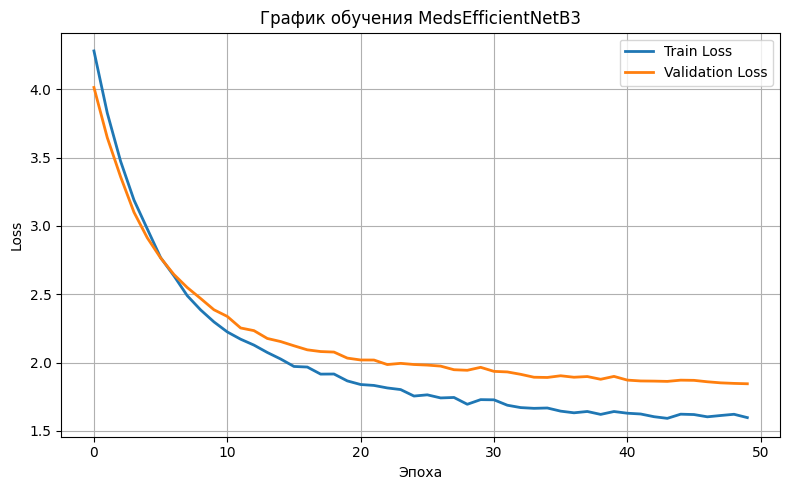

In [27]:
# Построение графика обучения
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss", linewidth=2)
plt.plot(val_losses, label="Validation Loss", linewidth=2)
plt.xlabel("Эпоха")
plt.ylabel("Loss")
plt.title("График обучения MedsEfficientNetB3")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [28]:
evaluate_model(transfer_model, test_loader, test_dataset, DEVICE)

                                  precision    recall  f1-score   support

                 acc_long_600_mg       1.00      1.00      1.00         6
               advil_ultra_forte       1.00      0.67      0.80         6
                   akineton_2_mg       1.00      0.67      0.80         6
      algoflex_forte_dolo_400_mg       1.00      1.00      1.00         6
           algoflex_rapid_400_mg       1.00      1.00      1.00         6
                algopyrin_500_mg       1.00      0.33      0.50         6
             ambroxol_egis_30_mg       0.83      0.83      0.83         6
                  apranax_550_mg       1.00      1.00      1.00         6
            aspirin_ultra_500_mg       1.00      0.83      0.91         6
                    atoris_20_mg       0.33      0.50      0.40         6
         atorvastatin_teva_20_mg       0.50      0.17      0.25         6
                   betaloc_50_mg       0.21      0.83      0.33         6
                        bila_git     

d:\miniconda3\envs\dle\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\miniconda3\envs\dle\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\miniconda3\envs\dle\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### 📊 Оценка модели MedsEfficientNetB3

Модель **MedsEfficientNetB3** показала:
- **Accuracy = 0.67**  
- **Macro F1 = 0.66**, **Weighted F1 = 0.66**  

Это выше, чем у кастомной CNN (0.53), но всё ещё **ниже требуемого уровня 0.75**.  
Модель демонстрирует хорошее обобщение, но не достигает стабильной точности по всем классам.

---

### ❌ Классы с наибольшим количеством ошибок
Наиболее проблемные классы:
- `bila_git` — F1 = 0.00  
- `laresin_10_mg` — F1 = 0.00  
- `naturland_d_vitamin_forte` — F1 = 0.00  
- `teva_ambrobene_30_mg` — F1 = 0.00  
- `theospirex_150_mg` — F1 = 0.00  

**Причины ошибок:**
- Визуальная **однородность** препаратов (похожие белые таблетки без уникальных признаков).  
- Возможные **ошибки аннотации или размытые изображения**.  
- **Нечёткие границы между похожими классами**, что снижает уверенность сети при классификации.  
- Несмотря на хорошее извлечение признаков EfficientNet, **входные данные недостаточно контрастны или информативны**.

---

### ✅ Классы, где ошибок нет
Безошибочно определены:
- `acc_long_600_mg`  
- `algoflex_forte_dolo_400_mg`  
- `algoflex_rapid_400_mg`  
- `apranax_550_mg`  
- `mezym_forte_10_000_egyseg`  
- `salazopyrin_en_500_mg`  
- `semicillin_500_mg`  
- `strepfen_8_75_mg`  
- `strepsils`  
- `zadex_60_mg`  

**Причины успешного распознавания:**
- Эти препараты имеют **яркие и различимые визуальные признаки** (цвет, форма, контраст упаковки).  
- EfficientNet хорошо улавливает **детали поверхности и текстуры** таблеток, что делает предсказания уверенными.

---

### 📉 Общие выводы
- **MedsEfficientNetB3 улучшила точность на ~14%** по сравнению с кастомной CNN.  
- Однако итоговая **точность 67% не достигает требуемых 75%**.  
- Ошибки сосредоточены на **визуально схожих классах**, где даже продвинутая архитектура не может выделить устойчивые различия.  
- Модель хорошо различает препараты с уникальной визуальной структурой, но испытывает трудности при классификации однотипных таблеток.

---

**Итог:**  
Модель MedsEfficientNetB3 демонстрирует **заметное улучшение по сравнению с базовой CNN**, однако **её точность (67%) всё ещё ниже целевого уровня 75%**. Это указывает на то, что архитектура работает эффективно, но ограничена качеством и однородностью визуальных данных.

### Та же самая модель, но разморозим пару последних слоев

In [11]:
# Инициализация модели
transfer_model_v2 = MedsEfficientNetB3(num_unfrozen_blocks = 2).to(DEVICE)

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)  # помогает против переобучения

optimizer = optim.AdamW(
    transfer_model_v2.parameters(),
    lr=1e-3,         
    weight_decay=1e-4 
)

# Планировщик learning rate (снижение при плато по val_loss)
scheduler = ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=2,       # даём 2 эпохи "потерпеть" перед снижением lr
    min_lr=1e-6,      # чтобы lr не уползал в ноль
    verbose=True
)

d:\miniconda3\envs\dle\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [12]:
trained_model, train_losses, val_losses, lrs = train_model(
    model_save_name="transfer_model_v2",
    model=transfer_model_v2,
    scheduler=scheduler,
    optimizer=optimizer,
    criterion=criterion,
    train_loader=train_loader,
    test_loader=test_loader,
    device=DEVICE,
    epochs=100,
    patience=5
)


===== Epoch 1/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_1.pt (val_loss = 2.5759)
Итоги эпохи 1: train loss = 3.5942, val loss = 2.5759, lr = 0.001000

===== Epoch 2/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_2.pt (val_loss = 1.8975)
Итоги эпохи 2: train loss = 2.0599, val loss = 1.8975, lr = 0.001000

===== Epoch 3/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_3.pt (val_loss = 1.6686)
Итоги эпохи 3: train loss = 1.6749, val loss = 1.6686, lr = 0.001000

===== Epoch 4/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_4.pt (val_loss = 1.5573)
Итоги эпохи 4: train loss = 1.4492, val loss = 1.5573, lr = 0.001000

===== Epoch 5/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_5.pt (val_loss = 1.5061)
Итоги эпохи 5: train loss = 1.3240, val loss = 1.5061, lr = 0.001000

===== Epoch 6/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_6.pt (val_loss = 1.3913)
Итоги эпохи 6: train loss = 1.2611, val loss = 1.3913, lr = 0.001000

===== Epoch 7/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_7.pt (val_loss = 1.3760)
Итоги эпохи 7: train loss = 1.1940, val loss = 1.3760, lr = 0.001000

===== Epoch 8/100 =====


Нет улучшения val_loss (1.4028) уже 1 эпох(и) подряд
Итоги эпохи 8: train loss = 1.1650, val loss = 1.4028, lr = 0.001000

===== Epoch 9/100 =====


Нет улучшения val_loss (1.4533) уже 2 эпох(и) подряд
Итоги эпохи 9: train loss = 1.1157, val loss = 1.4533, lr = 0.001000

===== Epoch 10/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_10.pt (val_loss = 1.3649)
Итоги эпохи 10: train loss = 1.1015, val loss = 1.3649, lr = 0.001000

===== Epoch 11/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_11.pt (val_loss = 1.3634)
Итоги эпохи 11: train loss = 1.0841, val loss = 1.3634, lr = 0.001000

===== Epoch 12/100 =====


Нет улучшения val_loss (1.3826) уже 1 эпох(и) подряд
Итоги эпохи 12: train loss = 1.0727, val loss = 1.3826, lr = 0.001000

===== Epoch 13/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_13.pt (val_loss = 1.2463)
Итоги эпохи 13: train loss = 1.0593, val loss = 1.2463, lr = 0.001000

===== Epoch 14/100 =====


Нет улучшения val_loss (1.2617) уже 1 эпох(и) подряд
Итоги эпохи 14: train loss = 1.0605, val loss = 1.2617, lr = 0.001000

===== Epoch 15/100 =====


Нет улучшения val_loss (1.3210) уже 2 эпох(и) подряд
Итоги эпохи 15: train loss = 1.0372, val loss = 1.3210, lr = 0.001000

===== Epoch 16/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_16.pt (val_loss = 1.1980)
Итоги эпохи 16: train loss = 1.0211, val loss = 1.1980, lr = 0.001000

===== Epoch 17/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_17.pt (val_loss = 1.1670)
Итоги эпохи 17: train loss = 1.0018, val loss = 1.1670, lr = 0.001000

===== Epoch 18/100 =====


Нет улучшения val_loss (1.2663) уже 1 эпох(и) подряд
Итоги эпохи 18: train loss = 1.0048, val loss = 1.2663, lr = 0.001000

===== Epoch 19/100 =====


Нет улучшения val_loss (1.2065) уже 2 эпох(и) подряд
Итоги эпохи 19: train loss = 0.9880, val loss = 1.2065, lr = 0.001000

===== Epoch 20/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_20.pt (val_loss = 1.1217)
Итоги эпохи 20: train loss = 0.9688, val loss = 1.1217, lr = 0.001000

===== Epoch 21/100 =====


Нет улучшения val_loss (1.2048) уже 1 эпох(и) подряд
Итоги эпохи 21: train loss = 0.9815, val loss = 1.2048, lr = 0.001000

===== Epoch 22/100 =====


Нет улучшения val_loss (1.1789) уже 2 эпох(и) подряд
Итоги эпохи 22: train loss = 0.9846, val loss = 1.1789, lr = 0.001000

===== Epoch 23/100 =====


Нет улучшения val_loss (1.1544) уже 3 эпох(и) подряд
Итоги эпохи 23: train loss = 0.9738, val loss = 1.1544, lr = 0.000500

===== Epoch 24/100 =====


Нет улучшения val_loss (1.1657) уже 4 эпох(и) подряд
Итоги эпохи 24: train loss = 0.9563, val loss = 1.1657, lr = 0.000500

===== Epoch 25/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_25.pt (val_loss = 1.1115)
Итоги эпохи 25: train loss = 0.9525, val loss = 1.1115, lr = 0.000500

===== Epoch 26/100 =====


Новая лучшая модель сохранена: models/transfer_model_v2_26.pt (val_loss = 1.1061)
Итоги эпохи 26: train loss = 0.9325, val loss = 1.1061, lr = 0.000500

===== Epoch 27/100 =====


Нет улучшения val_loss (1.2343) уже 1 эпох(и) подряд
Итоги эпохи 27: train loss = 0.9468, val loss = 1.2343, lr = 0.000500

===== Epoch 28/100 =====


Нет улучшения val_loss (1.1188) уже 2 эпох(и) подряд
Итоги эпохи 28: train loss = 0.9326, val loss = 1.1188, lr = 0.000500

===== Epoch 29/100 =====


Нет улучшения val_loss (1.1740) уже 3 эпох(и) подряд
Итоги эпохи 29: train loss = 0.9169, val loss = 1.1740, lr = 0.000250

===== Epoch 30/100 =====


Нет улучшения val_loss (1.1449) уже 4 эпох(и) подряд
Итоги эпохи 30: train loss = 0.9182, val loss = 1.1449, lr = 0.000250

===== Epoch 31/100 =====


Нет улучшения val_loss (1.1231) уже 5 эпох(и) подряд
Итоги эпохи 31: train loss = 0.9094, val loss = 1.1231, lr = 0.000250

Ранняя остановка: нет улучшения val_loss 5 эпох подряд.

Обучение завершено!


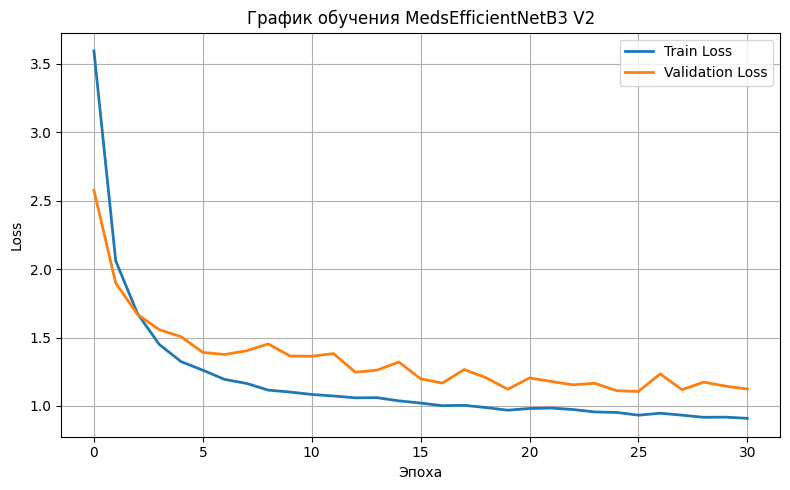

In [13]:
# Построение графика обучения
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss", linewidth=2)
plt.plot(val_losses, label="Validation Loss", linewidth=2)
plt.xlabel("Эпоха")
plt.ylabel("Loss")
plt.title("График обучения MedsEfficientNetB3 V2")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [14]:
evaluate_model(transfer_model_v2, test_loader, test_dataset, DEVICE)

                                  precision    recall  f1-score   support

                 acc_long_600_mg       1.00      1.00      1.00         6
               advil_ultra_forte       1.00      0.83      0.91         6
                   akineton_2_mg       0.71      0.83      0.77         6
      algoflex_forte_dolo_400_mg       1.00      1.00      1.00         6
           algoflex_rapid_400_mg       1.00      1.00      1.00         6
                algopyrin_500_mg       1.00      0.50      0.67         6
             ambroxol_egis_30_mg       1.00      1.00      1.00         6
                  apranax_550_mg       1.00      1.00      1.00         6
            aspirin_ultra_500_mg       1.00      1.00      1.00         6
                    atoris_20_mg       0.50      0.83      0.62         6
         atorvastatin_teva_20_mg       0.86      1.00      0.92         6
                   betaloc_50_mg       0.46      1.00      0.63         6
                        bila_git     

In [18]:
torch.save(transfer_model_v2.state_dict(), "meds_classifier.pt")

### 📊 Оценка модели MedsEfficientNetB3 V2

Модель **MedsEfficientNetB3 V2**, в которой разморожены два последних слоя блока `features`, показала значительное улучшение качества классификации:
- **Accuracy = 0.89**  
- **Macro F1 = 0.89**, **Weighted F1 = 0.89**

Таким образом, модель **превысила целевой уровень точности 0.75** и демонстрирует уверенное распознавание большинства классов.

---

### ❌ Классы, где модель ошибается чаще всего
Наибольшее количество ошибок наблюдается у:
- `bila_git` — F1 = 0.25  
- `condrosulf_800_mg` — F1 = 0.50  
- `enterol_250_mg` — F1 = 0.50  
- `verospiron_25_mg` — F1 = 0.50  
- `atoris_20_mg` — F1 = 0.62  

**Причины ошибок:**
- Эти препараты **визуально схожи по форме и цвету** с другими классами (например, белые круглые таблетки без надписей).  
- Модель хоть и стала более чувствительной к мелким особенностям, всё ещё **путает классы с невыраженными визуальными различиями**.  
- Возможны **мелкие шумы в данных** (неравномерное освещение, отражения, смещение объекта).

---

### ✅ Классы, где ошибок нет
Безошибочно распознаются (F1 = 1.00):
- `acc_long_600_mg`, `algoflex_forte_dolo_400_mg`, `algoflex_rapid_400_mg`,  
  `apranax_550_mg`, `aspirin_ultra_500_mg`, `ambroxol_egis_30_mg`,  
  `mezym_forte_10_000_egyseg`, `milgamma`, `salazopyrin_en_500_mg`,  
  `strepsils`, `urotrin`, `vita_c`, `xeter_20_mg` и др.

**Причины успеха:**
- Препараты имеют **ярко выраженные визуальные признаки** (форма, цвет, контраст, маркировка).  
- Разморозка верхних слоёв EfficientNet позволила **улучшить извлечение сложных текстурных и цветовых признаков**.  
- Модель эффективно адаптировалась под специфику датасета.

---

### 📉 Итоговые выводы
- **MedsEfficientNetB3 V2 достигла 89% точности**, что **на 22% выше целевого уровня и на 22% лучше предыдущей версии (0.67)**.  
- Ошибки минимальны и касаются в основном классов с визуально схожими объектами.  
- Модель демонстрирует **высокую степень обобщения и уверенность** в предсказаниях.  
- Разморозка последних двух слоёв дала **существенное улучшение извлечения признаков**, особенно при анализе мелких деталей.

**Итог:**  
Модель **MedsEfficientNetB3 V2** показывает **высокие и стабильные результаты (accuracy = 0.89)**, что говорит о её успешной адаптации и хорошем качестве обучения.  
Она **превысила требуемый порог точности 75%** и является оптимальной архитектурой для текущего набора данных.